In [1]:
!git clone https://github.com/hasan-besh/RCNN.git

Cloning into 'RCNN'...
remote: Enumerating objects: 3, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 3 (delta 0), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (3/3), 660 bytes | 660.00 KiB/s, done.


In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
!git init


Initialized empty Git repository in /content/.git/


In [4]:
!git status


On branch master

No commits yet

Untracked files:
  (use "git add <file>..." to include in what will be committed)
	.config/
	RCNN/
	gdrive/
	sample_data/

nothing added to commit but untracked files present (use "git add" to track)


In [8]:
!git submodule add /content/RCNN gdrive/MyDrive/RCNN/


'gdrive/MyDrive/RCNN' already exists in the index


In [9]:
!git add /content/gdrive/MyDrive/RCNN/data

fatal: Pathspec '/content/gdrive/MyDrive/RCNN/data' is in submodule 'gdrive/MyDrive/RCNN'


In [10]:
!git status

^C


In [12]:

!git config --global user.email "besharati.hasan@gmail"
!git config --global user.name "hasan-besh"

In [13]:
!git commit -m "Commit message"

[master (root-commit) 3cc2d38] Commit message
 1 file changed, 1 insertion(+)
 create mode 160000 gdrive/MyDrive/RCNN


<a href="https://colab.research.google.com/github/alsombra/Mask_RCNN-colab/blob/master/Mask_RCNN_practice.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Mask-RCNN practice (Updated 2022)

Inference demo notebook made for use in Google Colab

author: Antônio Luís Sombra

In [ ]:
%cd ..
from google.colab import drive
drive.mount('/content/gdrive')

/
Mounted at /content/gdrive


In [ ]:
!ln -s /content/gdrive/My\ Drive/ /mydrive

# Clone Repo

In [ ]:
!mkdir /mydrive/mask_rcnn

mkdir: cannot create directory ‘/mydrive/mask_rcnn’: File exists


In [ ]:
cd /mydrive/mask_rcnn

/content/gdrive/My Drive/mask_rcnn


In [ ]:
!git clone https://github.com/alsombra/Mask_RCNN-TF2

fatal: destination path 'Mask_RCNN-TF2' already exists and is not an empty directory.


In [ ]:
cd /mydrive/mask_rcnn/Mask_RCNN-TF2/

/content/gdrive/My Drive/mask_rcnn/Mask_RCNN-TF2


# Install libraries and Download pictures

In [ ]:
!pip install imgaug
!pip install Cython
!pip install pycocotools
!pip install kaggle

In [ ]:
!pip install -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.9/28.9 MB 38.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for scikit-image
  Running setup.py clean for scikit-image
Failed to build scikit-image
ERROR: Could not build wheels for scikit-image, which is required to install pyproject.toml-based projects


In [ ]:
# Update CUDA for TF 2.5
!wget https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64/libcudnn8_8.1.0.77-1+cuda11.2_amd64.deb
!dpkg -i libcudnn8_8.1.0.77-1+cuda11.2_amd64.deb
# Check if package has been installed
!ls -l /usr/lib/x86_64-linux-gnu/libcudnn.so.*
# Upgrade Tensorflow
!pip install --upgrade tensorflow==2.5.0

--2023-07-18 11:50:20--  https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64/libcudnn8_8.1.0.77-1+cuda11.2_amd64.deb
Resolving developer.download.nvidia.com (developer.download.nvidia.com)... 152.195.19.142
Connecting to developer.download.nvidia.com (developer.download.nvidia.com)|152.195.19.142|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 430460776 (411M) [application/x-deb]
Saving to: ‘libcudnn8_8.1.0.77-1+cuda11.2_amd64.deb’

libcudnn8_8.1.0.77- 100%[===================>] 410.52M  41.2MB/s    in 9.2s    

2023-07-18 11:50:29 (44.7 MB/s) - ‘libcudnn8_8.1.0.77-1+cuda11.2_amd64.deb’ saved [430460776/430460776]

dpkg: warning: downgrading libcudnn8 from 8.9.0.131-1+cuda11.8 to 8.1.0.77-1+cuda11.2
(Reading database ... 123105 files and directories currently installed.)
Preparing to unpack libcudnn8_8.1.0.77-1+cuda11.2_amd64.deb ...
Unpacking libcudnn8 (8.1.0.77-1+cuda11.2) over (8.9.0.131-1+cuda11.8) ...
Setting up libcudnn8 (8.1.0.77-

In [ ]:
!python setup.py install

/usr/local/lib/python3.10/dist-packages/setuptools/dist.py:755: SetuptoolsDeprecationWarning: Invalid dash-separated options
!!

        ********************************************************************************
        Usage of dash-separated 'description-file' will not be supported in future
        versions. Please use the underscore name 'description_file' instead.

        By 2023-Sep-26, you need to update your project and remove deprecated calls
        or your builds will no longer be supported.

        See https://setuptools.pypa.io/en/latest/userguide/declarative_config.html for details.
        ********************************************************************************

!!
  opt = self.warn_dash_deprecation(opt, section)
/usr/local/lib/python3.10/dist-packages/setuptools/dist.py:755: SetuptoolsDeprecationWarning: Invalid dash-separated options
!!

        ********************************************************************************
        Usage of dash-separa

In [ ]:
cd /mydrive/mask_rcnn/

/content/gdrive/My Drive/mask_rcnn


# Prepare Model

# 2022 - compatibility update

In [ ]:
import os #just another way to navegate through folders - using python
os.chdir('/mydrive/mask_rcnn/Mask_RCNN-TF2/samples')

In [ ]:
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

In [ ]:
!pip install pydicom

In [ ]:
import os
import gc
import sys
import time
import json
import glob
import random
from pathlib import Path
import pandas as pd

from PIL import Image
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from imgaug import augmenters as iaa

import itertools
from tqdm import tqdm
import pydicom
from pydicom.pixel_data_handlers.util import apply_voi_lut

import warnings
warnings.filterwarnings("ignore")

In [ ]:
import sys
import random
import math
import numpy as np
import skimage.io
import matplotlib
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow

# Root directory of the project
ROOT_DIR = os.path.abspath("../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
import mrcnn.model as modellib
import coco
#import importlib
#importlib.reload(modellib)
from mrcnn.config import Config
sys.path.append(os.path.join(ROOT_DIR, "samples/coco/"))  # To find local version


%matplotlib inline

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

# Directory of images to run detection on
IMAGE_DIR = os.path.join(ROOT_DIR, "images")

# Set Config parameters for Inference





In [ ]:
mask_df = pd.read_csv('/content/gdrive/MyDrive/RCNN/data/masks/masks.csv')
mask_df

,image_id,class_name,class_id,x_min,y_min,x_max,y_max
0,data/slices/slices_pic/subject24_top.tiff,normal tissue,1,179,248,240,309
1,data/slices/slices_pic/subject24_top.tiff,normal tissue,1,348,236,409,297
2,data/slices/slices_pic/subject24_middle.tiff,normal tissue,1,139,222,200,283
3,data/slices/slices_pic/subject24_middle.tiff,normal tissue,1,304,134,365,195
4,data/slices/slices_pic/subject24_bottom.tiff,normal tissue,1,127,195,188,256
...,...,...,...,...,...,...,...
163,data/slices/slices_pic/subject30_top.tiff,paraseptal emphysema,3,208,282,269,343
164,data/slices/slices_pic/subject30_top.tiff,paraseptal emphysema,3,150,286,211,347
165,data/slices/slices_pic/subject30_middle.tiff,paraseptal emphysema,3,262,262,323,323
166,data/slices/slices_pic/subject30_bottom.tiff,paraseptal emphysema,3,283,135,344,196


In [ ]:
def get_mask(img_dimensions, x_min, y_min, x_max, y_max):
    img_height, img_width = img_dimensions
    img_mask = np.full((img_height,img_width),0)
    img_mask[y_min:y_max,x_min:x_max] = 255

    return img_mask.astype(np.float32)


def rle_encoding(x):
    dots = np.where(x.T.flatten() == 255)[0]
    run_lengths = []
    prev = -2
    for b in dots:
        if (b>prev+1): run_lengths.extend((b + 1, 0))
        run_lengths[-1] += 1
        prev = b
    return ' '.join([str(x) for x in run_lengths])

In [ ]:
diagnostic_per_image = []

image_size=512
with tqdm(total=len(mask_df)) as pbar:
    for idx,row in mask_df.iterrows():
        image_id = row.image_id
        image_df = mask_df.query("image_id==@image_id")
        class_list = []
        RLE_list = []

        for diagnostic_id, diagnostic in image_df.iterrows():
            class_list.append(diagnostic.class_id)
            #print(image_id)

            dicom_image = cv2.imread(image_id,0)
            image_dimensions = dicom_image.shape
            #print(image_dimensions)
            image_id2 = image_id.split('/')[3]

            resized_img = cv2.resize(dicom_image, (image_size,image_size), interpolation = cv2.INTER_AREA)
            cv2.imwrite(resized_folder+'/'+image_id2, resized_img)

            mask = get_mask(image_dimensions, int(diagnostic.x_min), int(diagnostic.y_min), int(diagnostic.x_max), int(diagnostic.y_max))
            resized_mask = cv2.resize(mask, (image_size,image_size))
            RLE_list.append(rle_encoding(resized_mask))
        diagnostic_per_image.append({"image_id":image_id2,
                                     "CategoryId":class_list,
                                     "EncodedPixels":RLE_list})
        pbar.update(1)

100%|██████████| 168/168 [00:18<00:00,  9.28it/s]


In [ ]:
samples_df = pd.DataFrame(diagnostic_per_image)
samples_df["Height"] = image_size
samples_df["Width"] = image_size
samples_df

,image_id,CategoryId,EncodedPixels,Height,Width
0,subject24_top.tiff,"[1, 1]",[91897 61 92409 61 92921 61 93433 61 93945 61 ...,512,512
1,subject24_top.tiff,"[1, 1]",[91897 61 92409 61 92921 61 93433 61 93945 61 ...,512,512
2,subject24_middle.tiff,"[1, 1]",[71391 61 71903 61 72415 61 72927 61 73439 61 ...,512,512
3,subject24_middle.tiff,"[1, 1]",[71391 61 71903 61 72415 61 72927 61 73439 61 ...,512,512
4,subject24_bottom.tiff,"[1, 1]",[65220 61 65732 61 66244 61 66756 61 67268 61 ...,512,512
...,...,...,...,...,...
163,subject30_top.tiff,"[3, 3]",[106779 61 107291 61 107803 61 108315 61 10882...,512,512
164,subject30_top.tiff,"[3, 3]",[106779 61 107291 61 107803 61 108315 61 10882...,512,512
165,subject30_middle.tiff,[3],[134407 61 134919 61 135431 61 135943 61 13645...,512,512
166,subject30_bottom.tiff,"[3, 3]",[145032 61 145544 61 146056 61 146568 61 14708...,512,512


In [ ]:
class CocoConfig(Config):
    """Configuration for training on MS COCO.
    Derives from the base Config class and overrides values specific
    to the COCO dataset.
    """
    # Give the configuration a recognizable name
    NAME = "coco"

    # We use a GPU with 12GB memory, which can fit two images.
    # Adjust down if you use a smaller GPU.
    IMAGES_PER_GPU = 1

    # Uncomment to train on 8 GPUs (default is 1)
    # GPU_COUNT = 8

    # Number of classes (including background)
    NUM_CLASSES = 1 + 80  # COCO has 80 classes

class InferenceConfig(CocoConfig):
    # Set batch size to 1 since we'll be running inference on
    # one image at a time. Batch size = GPU_COUNT * IMAGES_PER_GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    ############################### CHANGE HYPERPARAMETERS HERE ##################
    RPN_NMS_THRESHOLD = 0.01
    DETECTION_MIN_CONFIDENCE = 0.7
    DETECTION_NMS_THRESHOLD = 0.7


config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.7
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                93
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [ ]:
COCO_WEIGHTS_PATH = '/content/drive/MyDrive/RCNN/Mask-RCNN-TF2/mask_rcnn_coco.h5'
IMAGE_SIZE=512
class DiagnosticConfig(Config):
    NAME = "Diagnostic"
    NUM_CLASSES = 4 # +1 for the background class

    GPU_COUNT = 1
    IMAGES_PER_GPU = 2 #That is the maximum with the memory available on kernels

    BACKBONE = 'resnet50'

    IMAGE_MIN_DIM = IMAGE_SIZE
    IMAGE_MAX_DIM = IMAGE_SIZE
    IMAGE_RESIZE_MODE = 'none'

    POST_NMS_ROIS_TRAINING = 250
    POST_NMS_ROIS_INFERENCE = 150
    MAX_GROUNDTRUTH_INSTANCES = 5
    BACKBONE_STRIDES = [4, 8, 16, 32, 64]
    BACKBONESHAPE = (8, 16, 24, 32, 48)
    RPN_ANCHOR_SCALES = (8,16,24,32,48)
    ROI_POSITIVE_RATIO = 0.33
    DETECTION_MAX_INSTANCES = 300
    DETECTION_MIN_CONFIDENCE = 0.7
    # STEPS_PER_EPOCH should be the number of instances
    # divided by (GPU_COUNT*IMAGES_PER_GPU), and so should VALIDATION_STEPS;
    # however, due to the time limit, I set them so that this kernel can be run in 9 hours
    STEPS_PER_EPOCH = int(len(samples_df)*0.9/IMAGES_PER_GPU)
    VALIDATION_STEPS = len(samples_df)-int(len(samples_df)*0.9/IMAGES_PER_GPU)

config = DiagnosticConfig()
config.display()


Configurations:
BACKBONE                       resnet50
BACKBONESHAPE                  (8, 16, 24, 32, 48)
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        300
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                16
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              none
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL

In [ ]:
resized_folder = "data/working"
category_list = ["normal tissue", "centrilobular emphysema", "paraseptal emphysema"]

class DiagnosticDataset(utils.Dataset):
    def __init__(self, df):
        super().__init__(self)

        # Add classes
        for i, name in enumerate(category_list):
            self.add_class("diagnostic", i+1, name)

        # Add images
        for i, row in df.iterrows():
            self.add_image("diagnostic",
                           image_id=row.name,
                           path=resized_folder+'/'+str(row.image_id),
                           labels=row['CategoryId'],
                           annotations=row['EncodedPixels'],
                           height=row['Height'], width=row['Width'])

    def image_reference(self, image_id):
        info = self.image_info[image_id]
        return info['path'], [category_list[int(x)] for x in info['labels']]

    def load_image(self, image_id):
        #print(self.image_info[image_id]['path'])
        image3 = cv2.imread(self.image_info[image_id]['path'])
        #cv2_imshow(image3)

        return cv2.imread(self.image_info[image_id]['path'])

    def load_mask(self, image_id):
        info = self.image_info[image_id]
        #print(info['labels'])

        mask = np.zeros((IMAGE_SIZE, IMAGE_SIZE, len(info['annotations'])), dtype=np.uint8)
        labels = []

        for m, (annotation, label) in enumerate(zip(info['annotations'], info['labels'])):
            sub_mask = np.full(info['height']*info['width'], 0, dtype=np.uint8)
            annotation = [int(x) for x in annotation.split(' ')]

            for i, start_pixel in enumerate(annotation[::2]):
                sub_mask[start_pixel: start_pixel+annotation[2*i+1]] = 1

            sub_mask = sub_mask.reshape((info['height'], info['width']), order='F')
            sub_mask = cv2.resize(sub_mask, (IMAGE_SIZE, IMAGE_SIZE), interpolation=cv2.INTER_NEAREST)

            mask[:, :, m] = sub_mask
            labels.append(int(label))
        return mask, np.array(labels)

In [ ]:
samples_df

,image_id,CategoryId,EncodedPixels,Height,Width
0,subject24_top.tiff,"[1, 1]",['91897 61 92409 61 92921 61 93433 61 93945 61...,512,512
1,subject24_top.tiff,"[1, 1]",['91897 61 92409 61 92921 61 93433 61 93945 61...,512,512
2,subject24_middle.tiff,"[1, 1]",['71391 61 71903 61 72415 61 72927 61 73439 61...,512,512
3,subject24_middle.tiff,"[1, 1]",['71391 61 71903 61 72415 61 72927 61 73439 61...,512,512
4,subject24_bottom.tiff,"[1, 1]",['65220 61 65732 61 66244 61 66756 61 67268 61...,512,512
...,...,...,...,...,...
163,subject30_top.tiff,"[3, 3]",['106779 61 107291 61 107803 61 108315 61 1088...,512,512
164,subject30_top.tiff,"[3, 3]",['106779 61 107291 61 107803 61 108315 61 1088...,512,512
165,subject30_middle.tiff,[3],['134407 61 134919 61 135431 61 135943 61 1364...,512,512
166,subject30_bottom.tiff,"[3, 3]",['145032 61 145544 61 146056 61 146568 61 1470...,512,512


0
[1 1]


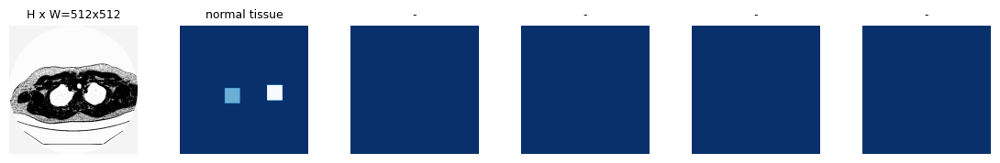

1
[1 1]


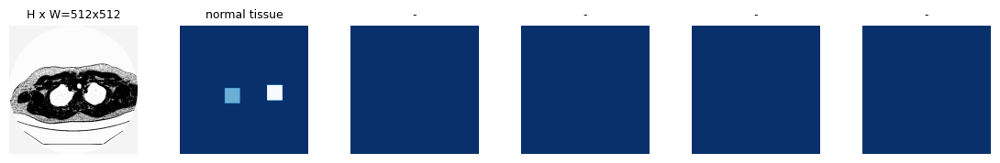

2
[1 1]


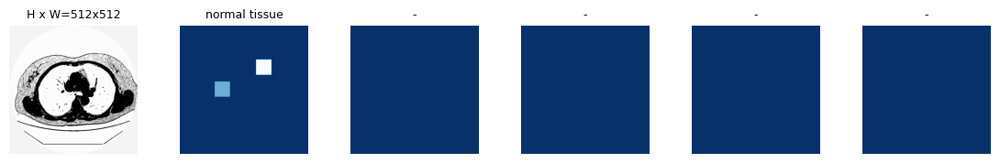

3
[1 1]


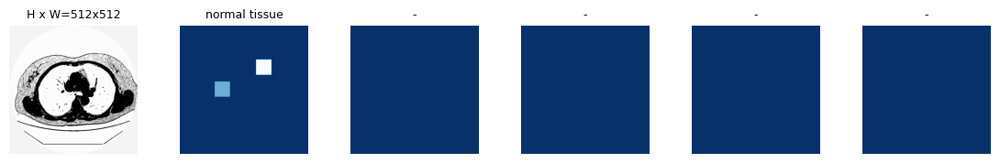

4
[1 1]


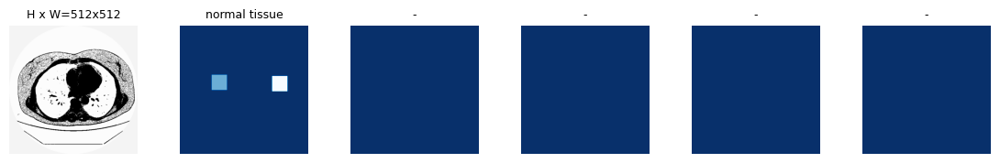

5
[1 1]


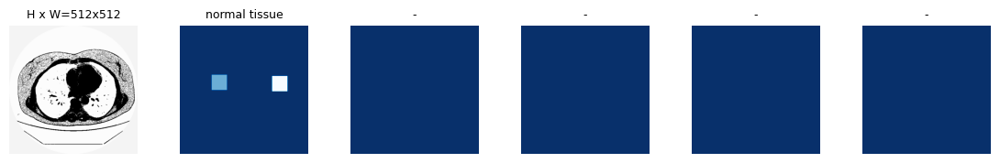

6
[1]


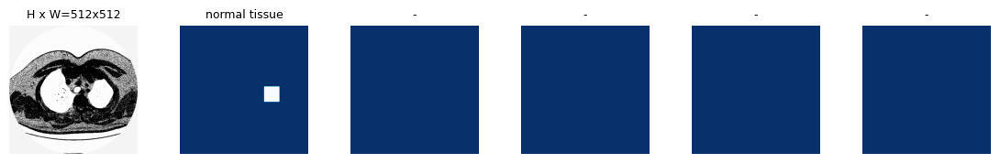

7
[1 1]


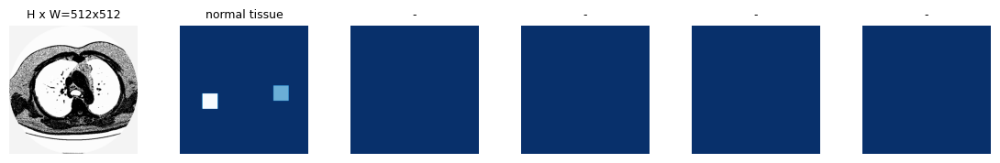

8
[1 1]


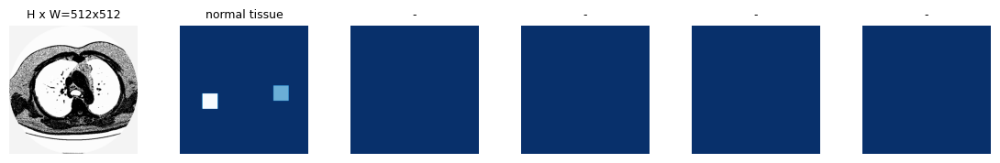

9
[1 1]


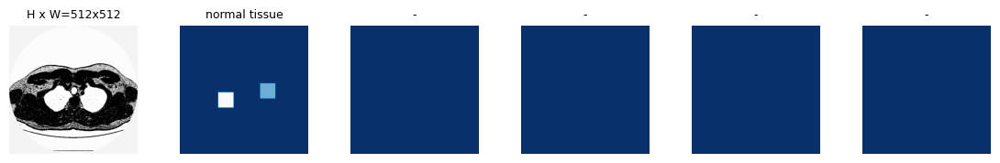

In [ ]:
training_percentage = 0.9

training_set_size = int(training_percentage*len(samples_df))
validation_set_size = int((1-training_percentage)*len(samples_df))

train_dataset = DiagnosticDataset(samples_df[:training_set_size])
train_dataset.prepare()

valid_dataset = DiagnosticDataset(samples_df[training_set_size:training_set_size+validation_set_size])
valid_dataset.prepare()

for i in range(10):
    image_id = train_dataset.image_ids[i]
    print(image_id)
    image = train_dataset.load_image(image_id)
    mask, class_ids = train_dataset.load_mask(image_id)
    print(class_ids)
    visualize.display_top_masks(image, mask, class_ids, train_dataset.class_names, limit=5)

In [ ]:
LR = 1e-4
EPOCHS = [1,18]

model = modellib.MaskRCNN(mode='training', config=config, model_dir=MODEL_DIR)
model.load_weights(COCO_MODEL_PATH, by_name=True, exclude=['mrcnn_class_logits', 'mrcnn_bbox_fc', 'mrcnn_bbox', 'mrcnn_mask'])

In [ ]:
%%time
model.train(train_dataset, valid_dataset,
            learning_rate=LR,
            epochs=EPOCHS[0],
            layers='heads')

history = model.keras_model.history.history


Starting at epoch 0. LR=0.0001

Checkpoint Path: /content/gdrive/MyDrive/mask_rcnn/Mask_RCNN-TF2/logs/diagnostic20230718T1230/mask_rcnn_diagnostic_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
rpn_model              (Functional)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistributed)
mrcnn_mask_bn4         (TimeDistributed)
mrcnn_bbox_fc          (Tim

ValueError: ignored

In [ ]:
# COCO Class names
# Index of the class in the list is its ID. For example, to get ID of
# the teddy bear class, use: class_names.index('teddy bear')
class_names = ['BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
               'bus', 'train', 'truck', 'boat', 'traffic light',
               'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird',
               'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear',
               'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
               'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
               'kite', 'baseball bat', 'baseball glove', 'skateboard',
               'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup',
               'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
               'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
               'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed',
               'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
               'keyboard', 'cell phone', 'microwave', 'oven', 'toaster',
               'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
               'teddy bear', 'hair drier', 'toothbrush']

# Prediction and Visualization

/usr/local/lib/python3.7/dist-packages/keras/engine/training_v1.py:2079: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


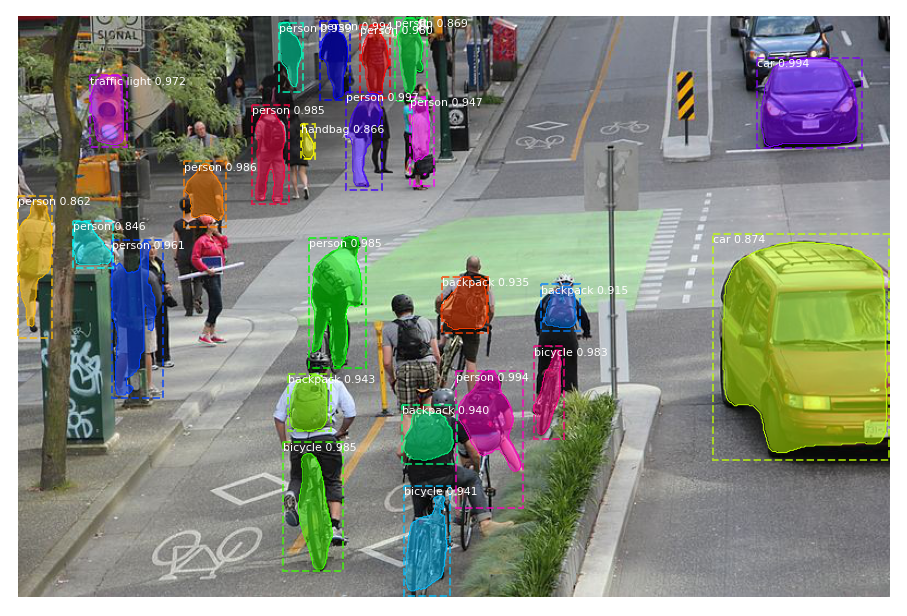

In [ ]:
path = '/mydrive/mask_rcnn/street_tutorial.jpeg'
#'/mydrive/mask_rcnn/street.jpg'
#../images/8829708882_48f263491e_z.jpg'
image = skimage.io.imread(path)

# Run detection
results = model.detect([image], verbose=0)

# Visualize results
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'],
                            class_names, r['scores'])

In [ ]:
print('Numero de objetos encontrados: ', len(r['rois']))

Numero de objetos encontrados:  24


# Exercise
---
1) **Test the Mask-RCNN on an image of your choice**

obs: Make sure every known object is detected by changing config parameters (thresholds)

2) Or **Test the Mask-RCNN on street_tutorial.jpeg using the config parameters given in the shared document**

[Paste your result in this shared document](https://docs.google.com/document/d/1rlAIbE_DdYP-BKfV4_Z5nKXwYnGdykGbuqZ0M9kSFdU/edit?usp=sharing)



# PART 2: **Background Removal application**

In [ ]:
path = '/mydrive/mask_rcnn/bill.jpg'
#'/mydrive/mask_rcnn/street_tutorial.jpeg'
#../images/8829708882_48f263491e_z.jpg'
image = skimage.io.imread(path)

# Run detection
results = model.detect([image], verbose=0)

# Visualize results
r = results[0]
#visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])

In [ ]:
def segment(image, r):
  idx = r['scores'].argmax()
  mask = r['masks'][:,:,idx]
  mask = np.stack((mask,)*3, axis=-1)
  mask = mask.astype('uint8')
  bg = 255 - mask * 255
  mask_img = image*mask
  result = mask_img+ bg
  return result

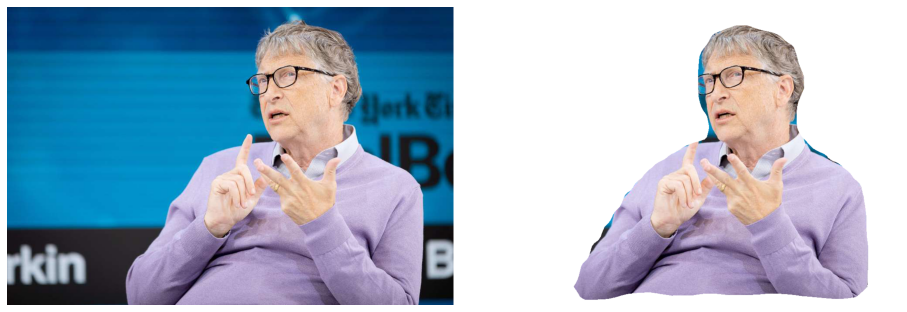

In [ ]:
segmentation = segment(image, r)
plt.subplots(1, figsize=(16, 16))
plt.axis('off')
plt.imshow(np.concatenate([image, segmentation], axis = 1))


# PART 3 **Mask-RCNN - on Video**




In [ ]:
cd /mydrive/mask_rcnn

/content/gdrive/My Drive/mask_rcnn


In [ ]:
!wget  https://www.dropbox.com/s/35jw9yy0hle0wbw/soccer_fight360p.mp4

--2022-05-19 14:52:26--  https://www.dropbox.com/s/35jw9yy0hle0wbw/soccer_fight360p.mp4
Resolving www.dropbox.com (www.dropbox.com)... 162.125.9.18, 2620:100:601b:18::a27d:812
Connecting to www.dropbox.com (www.dropbox.com)|162.125.9.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/35jw9yy0hle0wbw/soccer_fight360p.mp4 [following]
--2022-05-19 14:52:26--  https://www.dropbox.com/s/raw/35jw9yy0hle0wbw/soccer_fight360p.mp4
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc658f229f12afef34431feeabc7.dl.dropboxusercontent.com/cd/0/inline/Blnw09iKvIKBpbT3_0GfAqHNjxtfHr8WoyCoVra5Ft1DsQ3aULcXbLiM3OEzSaN232TVnuiSWXb8PMsft8YStXVOfTjkg4w9NSKR5gl9AuPqKc-YRqZ6njKHjw9WaM_AVnADitMkmpoOzs9t5I7AYRemliaqQKw3mVxOUbP2zhC0rA/file# [following]
--2022-05-19 14:52:27--  https://uc658f229f12afef34431feeabc7.dl.dropboxusercontent.com/cd/0/inline/Blnw09iKvIKBpbT3_0GfAqHNjxtfHr8WoyCoVra5Ft1D

### Define Parameters

In [ ]:
# Input arguments

#CHANGE CODE HERE
####################################
video = '/mydrive/mask_rcnn/soccer_fight360p.mp4'     ######## put the name of your video file HERE
save_fps = 30
####################################

weightsfile = "/mydrive/mask_rcnn/Mask_RCNN-TF2/mask_rcnn_coco.h5" # pre-trained weights

# Video save codec
##change this for different video types if you get errors
fourcc = cv2.VideoWriter_fourcc(*'MP4V')
#Other options
#cv2.VideoWriter_fourcc('M','P','E','G')
#cv2.VideoWriter_fourcc('M', 'J', 'P', 'G')
#cv2.VideoWriter_fourcc(*'DIVX') -> para .avi

#### See your input video

In [ ]:
from IPython.display import HTML
from base64 import b64encode

video_path = video ######## put the name of your video file HERE

mp4 = open(video_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

### Run Mask-RCNN on video

In [ ]:
cd /mydrive/mask_rcnn/Mask_RCNN-TF2/mrcnn

/content/gdrive/My Drive/mask_rcnn/Mask_RCNN-TF2/mrcnn


In [ ]:
ls

config.py    model.py           __pycache__/  visualize.py
__init__.py  parallel_model.py  utils.py


### Utility functions




In [ ]:
from urllib.request import proxy_bypass
import io
from PIL import Image
import matplotlib.pyplot as plt
def random_colors(N, bright=True):
    """
    Generate random colors.
    To get visually distinct colors, generate them in HSV space then
    convert to RGB.
    """
    brightness = 1.0 if bright else 0.7
    hsv = [(i / N, 1, brightness) for i in range(N)]
    colors = list(map(lambda c: colorsys.hsv_to_rgb(*c), hsv))
    random.shuffle(colors)
    return colors

def apply_mask(image, mask, color, alpha=0.5):
    """Apply the given mask to the image.
    """
    for c in range(3):
        image[:, :, c] = np.where(mask == 1,
                                  image[:, :, c] *
                                  (1 - alpha) + alpha * color[c] * 255,
                                  image[:, :, c])
    return image


def display_instances(image, boxes, masks, class_ids, class_names,
                      scores=None, title="",
                      figsize=(16, 16), ax=None,
                      show_mask=True, show_bbox=True,
                      colors=None, captions=None):
    """
    boxes: [num_instance, (y1, x1, y2, x2, class_id)] in image coordinates.
    masks: [height, width, num_instances]
    class_ids: [num_instances]
    class_names: list of class names of the dataset
    scores: (optional) confidence scores for each box
    title: (optional) Figure title
    show_mask, show_bbox: To show masks and bounding boxes or not
    figsize: (optional) the size of the image
    colors: (optional) An array or colors to use with each object
    captions: (optional) A list of strings to use as captions for each object
    """
    # Number of instances
    N = boxes.shape[0]
    if not N:
        print("\n*** No instances to display *** \n")
    else:
        assert boxes.shape[0] == masks.shape[-1] == class_ids.shape[0]

    # If no axis is passed, create one and automatically call show()
    auto_show = False
    if not ax:
        _, ax = plt.subplots(1, figsize=figsize)
        auto_show = True

    # Generate random colors
    colors = colors or random_colors(N)

    # Show area outside image boundaries.
    height, width = image.shape[:2]
    ax.set_ylim(height + 10, -10)
    ax.set_xlim(-10, width + 10)
    ax.axis('off')
    ax.set_title(title)

    masked_image = image.astype(np.uint32).copy()

    keys_list = list(colors)
    for i in range(N):
        color = colors[i]

        # Bounding box
        if not np.any(boxes[i]):
            # Skip this instance. Has no bbox. Likely lost in image cropping.
            continue
        y1, x1, y2, x2 = boxes[i]
        if show_bbox:
            p = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2,
                                alpha=0.7, linestyle="dashed",
                                edgecolor=color, facecolor='none')
            ax.add_patch(p)

        # Label
        if not captions:
            class_id = class_ids[i]
            score = scores[i] if scores is not None else None
            label = class_names[class_id]
            caption = "{} {:.3f}".format(label, score) if score else label
        else:
            caption = captions[i]
        ax.text(x1, y1 + 8, caption,
                color='w', size=11, backgroundcolor="none")

        # Mask
        mask = masks[:, :, i]
        if show_mask:
            masked_image = apply_mask(masked_image, mask, color)

        # Mask Polygon
        # Pad to ensure proper polygons for masks that touch image edges.
        padded_mask = np.zeros(
            (mask.shape[0] + 2, mask.shape[1] + 2), dtype=np.uint8)
        padded_mask[1:-1, 1:-1] = mask
        contours = find_contours(padded_mask, 0.5)
        for verts in contours:
            # Subtract the padding and flip (y, x) to (x, y)
            verts = np.fliplr(verts) - 1
            p = Polygon(verts, facecolor="none", edgecolor=color)
            ax.add_patch(p)
    ax.imshow(masked_image.astype(np.uint8))
    plt.savefig('img_frame.jpg', format='jpg')
    im = np.array(Image.open('img_frame.jpg'))
    plt.clf()
    plt.close('all')
    return im
    if auto_show:
        plt.show()

Video resolution :  360 640


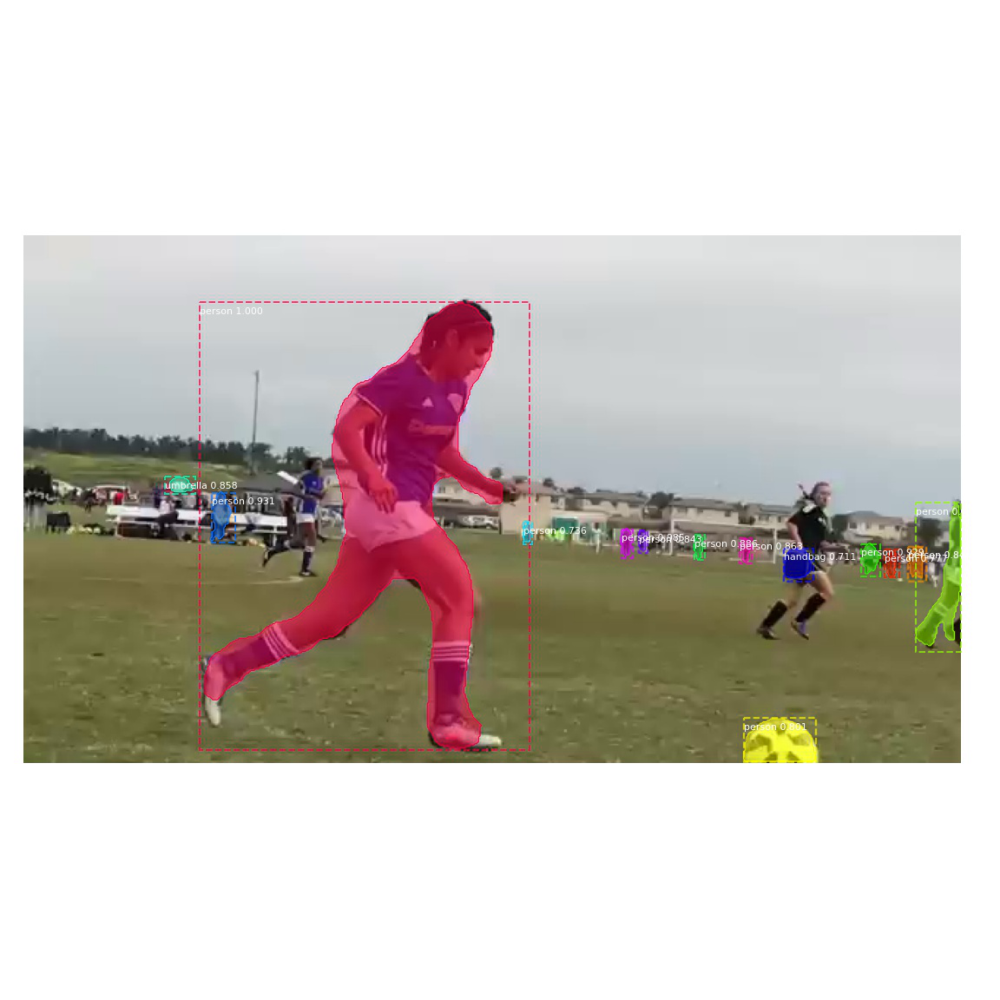

frame_shape: (1152, 1152, 3)
<class 'numpy.ndarray'>


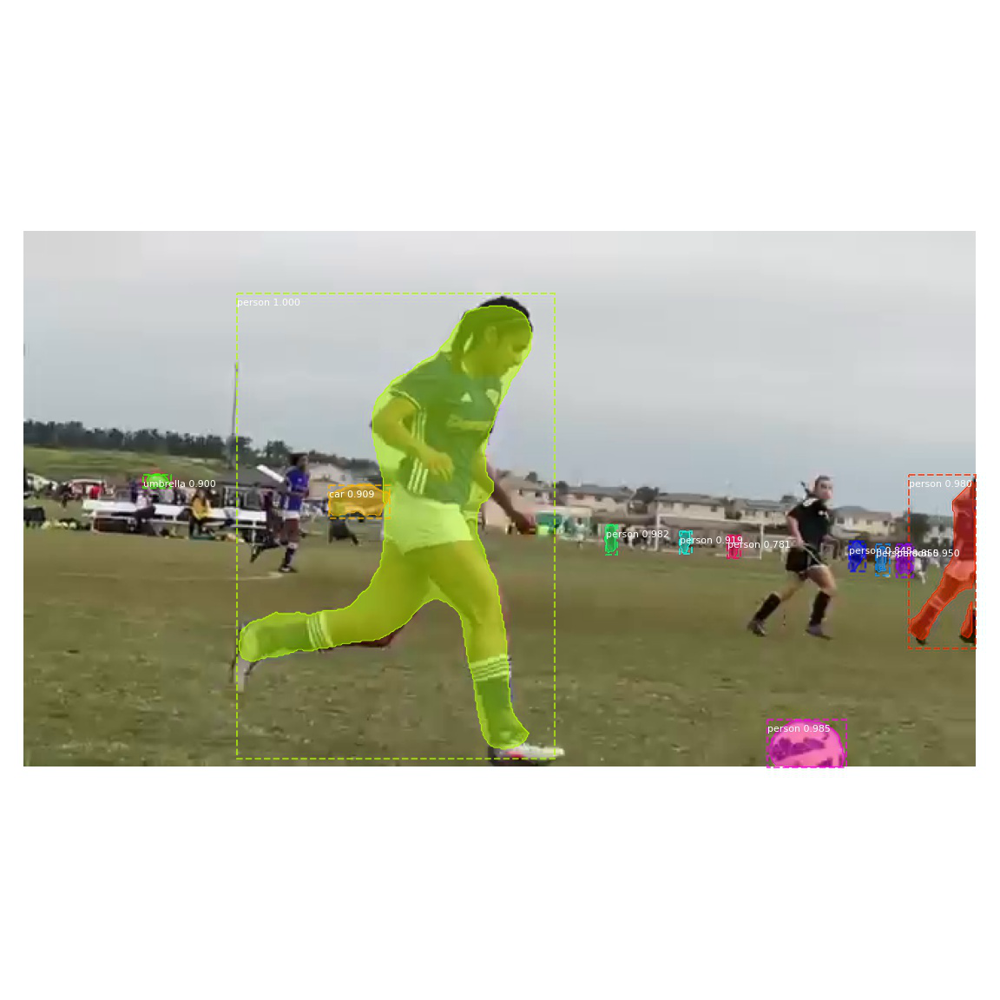

frame_shape: (1152, 1152, 3)
<class 'numpy.ndarray'>


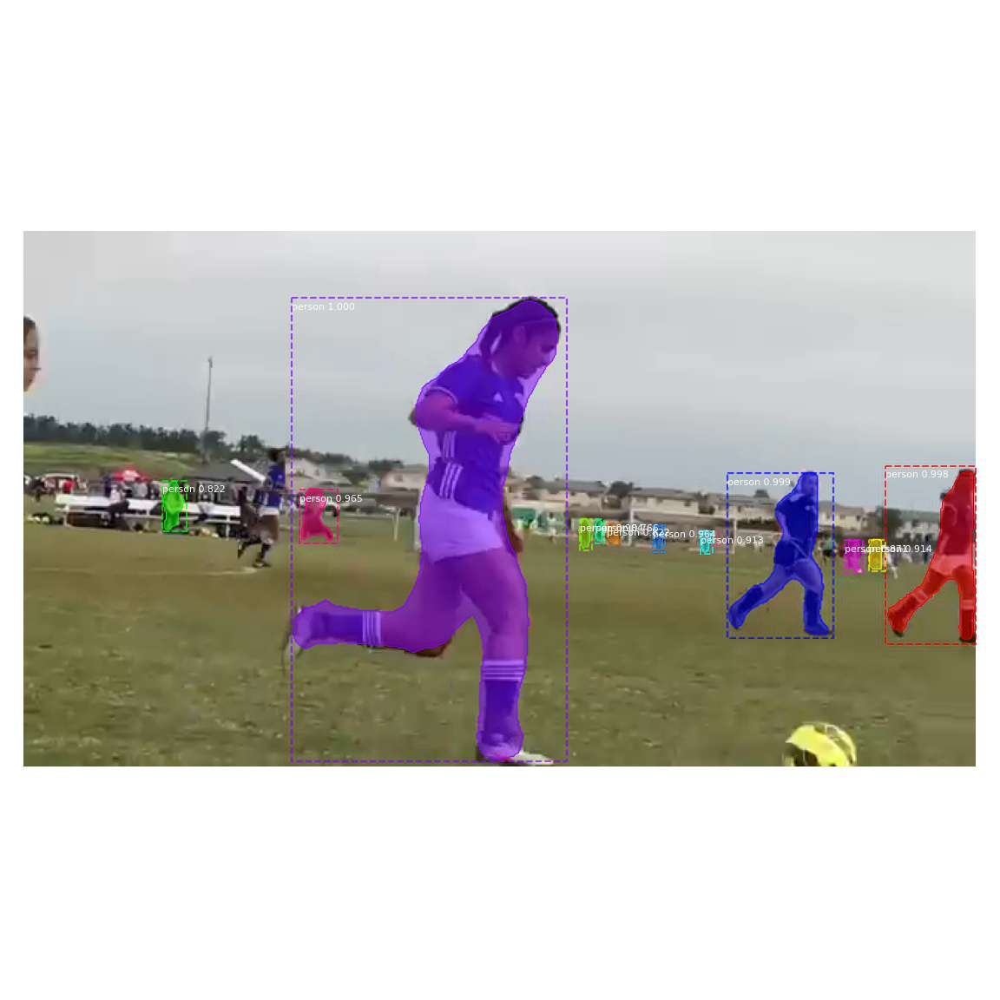

frame_shape: (1152, 1152, 3)
<class 'numpy.ndarray'>


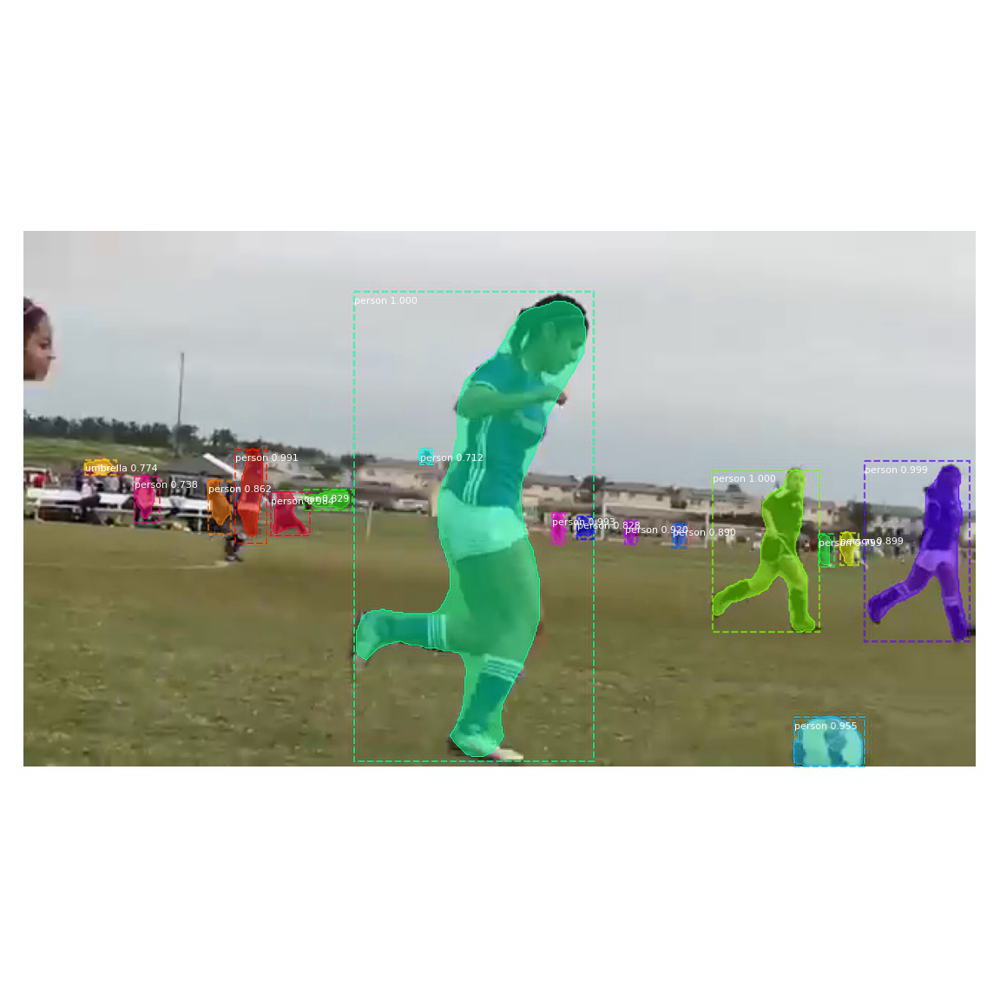

frame_shape: (1152, 1152, 3)
<class 'numpy.ndarray'>


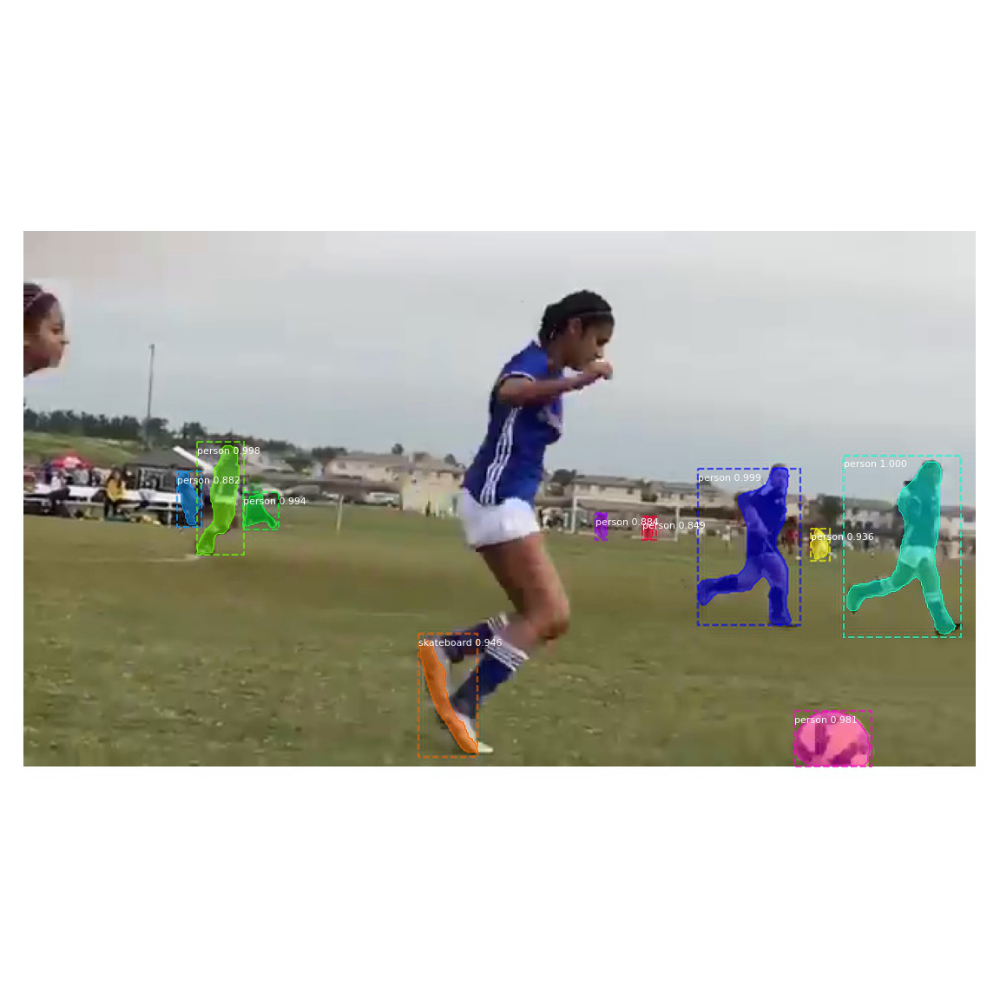

frame_shape: (1152, 1152, 3)
<class 'numpy.ndarray'>


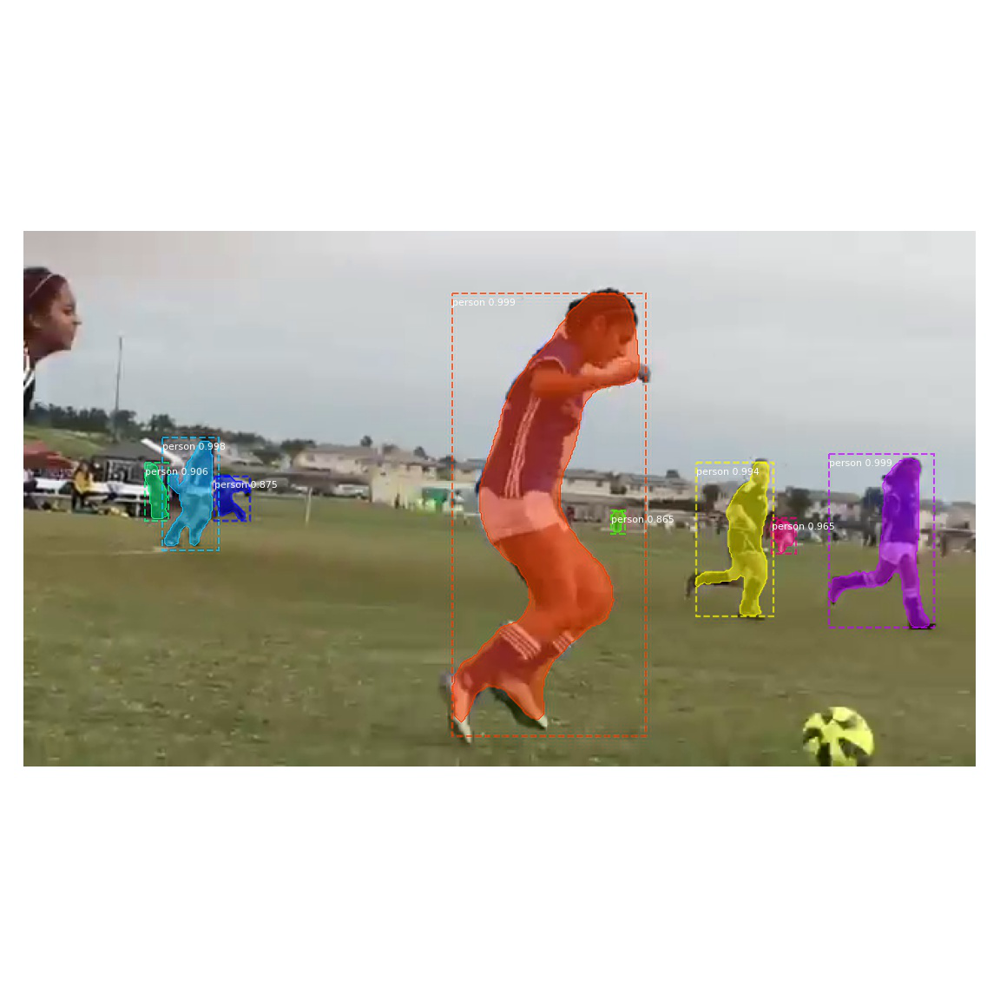

frame_shape: (1152, 1152, 3)
<class 'numpy.ndarray'>


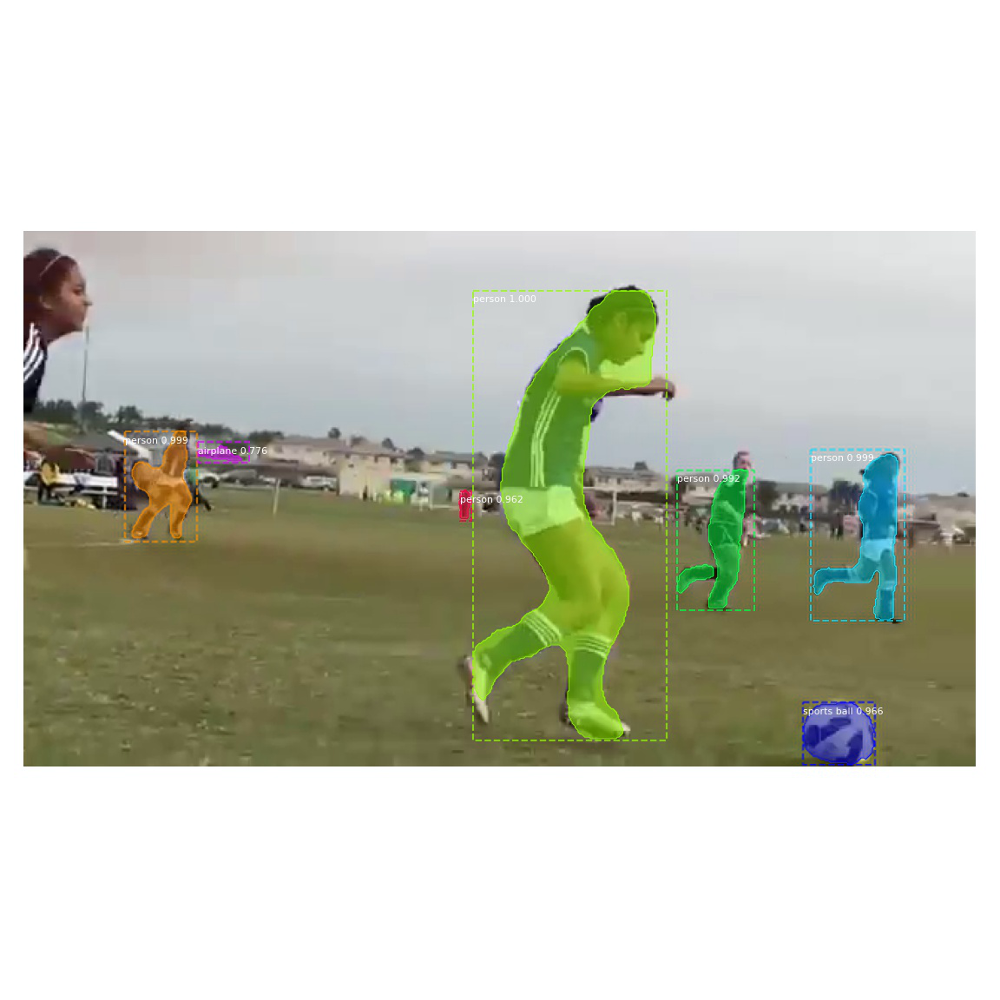

frame_shape: (1152, 1152, 3)
<class 'numpy.ndarray'>


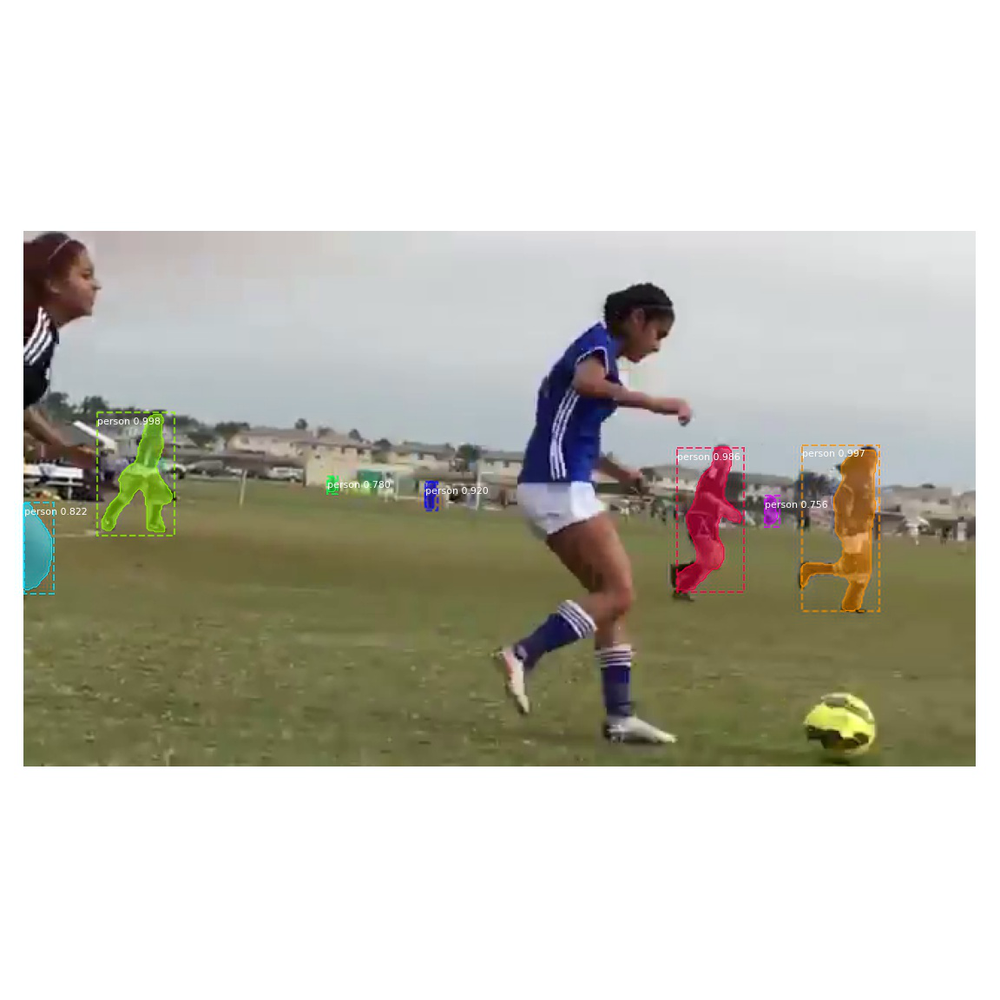

frame_shape: (1152, 1152, 3)
<class 'numpy.ndarray'>


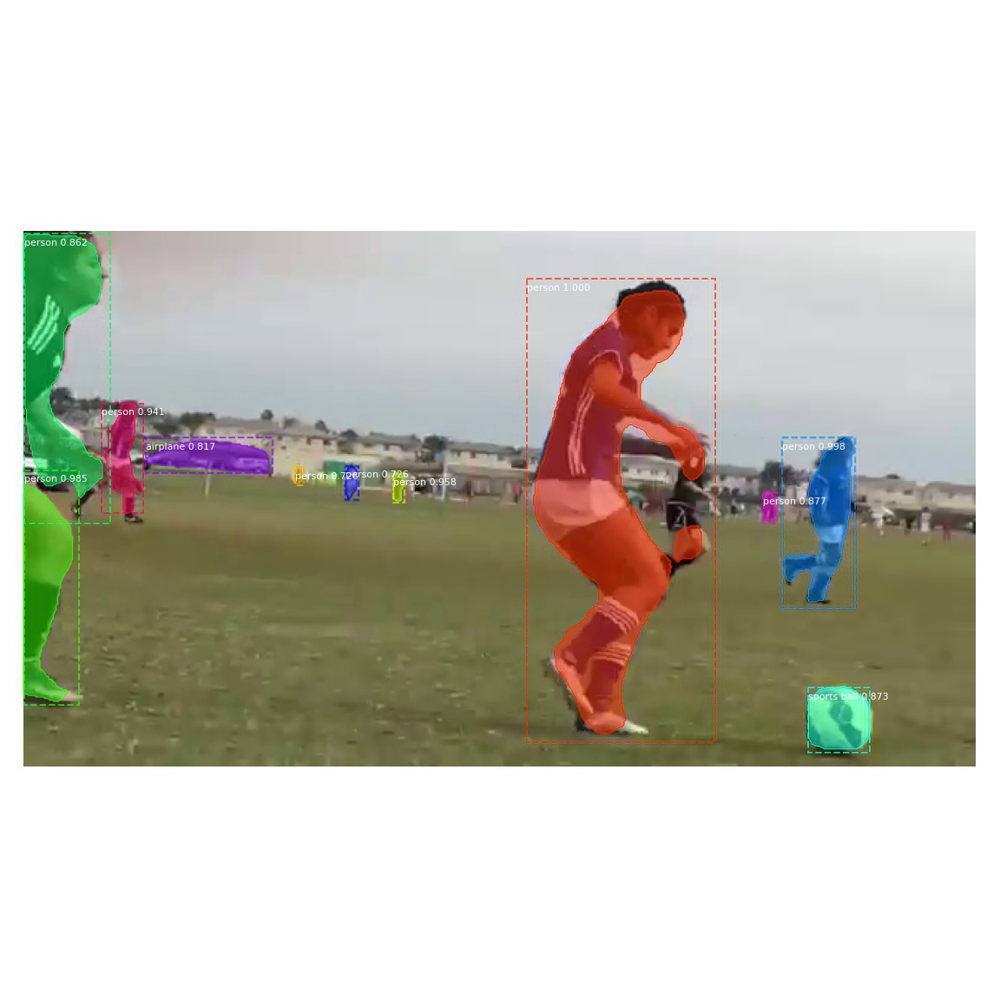

frame_shape: (1152, 1152, 3)
<class 'numpy.ndarray'>


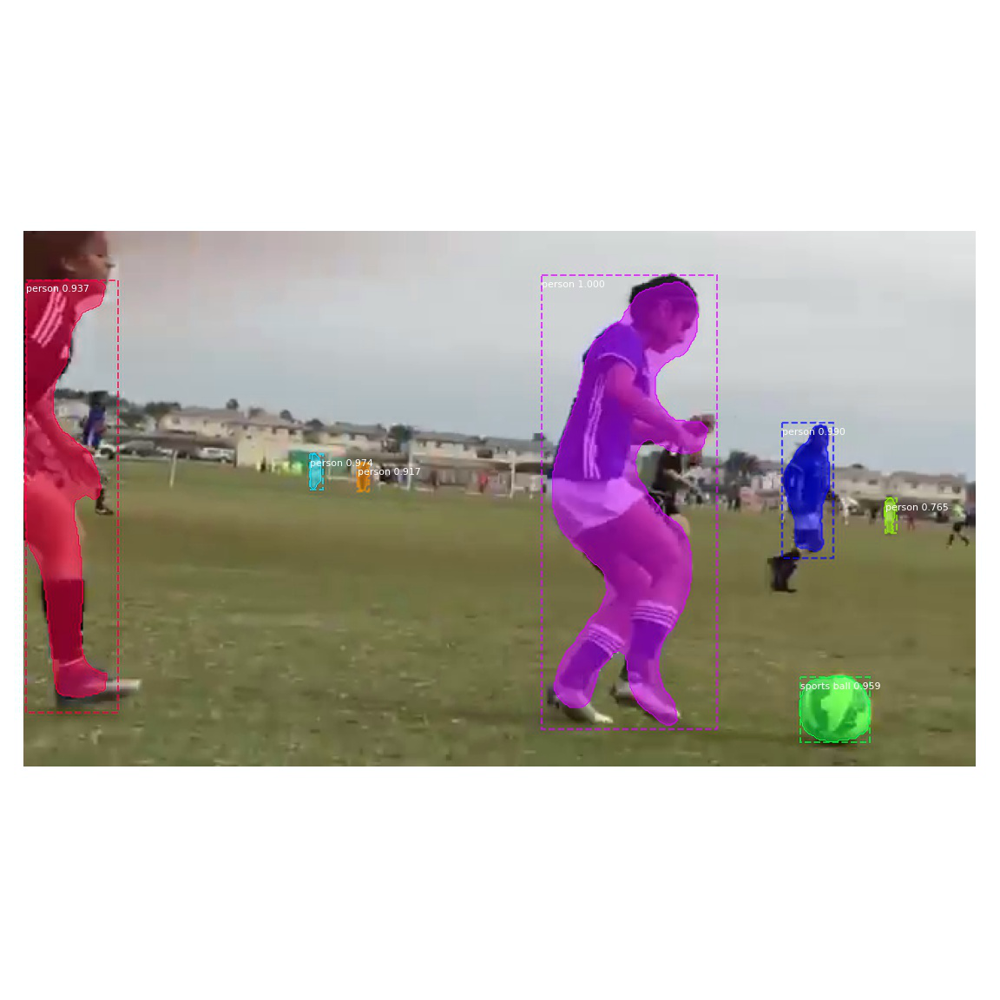

frame_shape: (1152, 1152, 3)
<class 'numpy.ndarray'>
10 processed frames ok
Video processed with Masked-RCNN and saved as /mydrive/mask_rcnn/soccer_fight360p_mask_rcnn.mp4
Total time elapsed: 11.018 segundos


In [ ]:
from google.colab.patches import cv2_imshow
#from visualize_cv import display_instances
import time

start = time.time()
videofile = video

cap = cv2.VideoCapture(videofile)
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))

print("Video resolution : ", height, width)
assert cap.isOpened(), 'Cannot capture source'



#Add extension mask_rcnn to video name
video_mask_rcnn =  video.split(".")[0] + "_mask_rcnn." + video.split(".")[1]

#Video save
videoSaved = cv2.VideoWriter(video_mask_rcnn, apiPreference=cv2.CAP_FFMPEG,
                             fourcc = fourcc,fps =save_fps, frameSize=(width, height),
                             isColor= True)

frames = 0

while cap.isOpened():

    ret, frame = cap.read()
    if ret:

        #Inference
        #
        results = model.detect([frame], verbose=0)
        r = results[0]
        frame = display_instances(frame, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])

        ## Uncomment below if you want to see the results frame by frame
        cv2_imshow(frame)

        # video save line
        videoSaved.write(frame)

        print('frame_shape:', frame.shape)
        print(type(frame))
        frames += 1
        if frames%10 == 0: print("{} processed frames ok".format(frames));break;
    else:
        break
videoSaved.release()
end = time.time()
print("Video processed with Masked-RCNN and saved as " + video_mask_rcnn)
print('Total time elapsed: {:.3f} segundos'.format((end - start)))

NOW CHECK THE PROCESSED VIDEO ON YOUR Google Drive mrcnn folder

# PART 4 **Mask-RCNN - on Video application**



### BACKGROUND REMOVAL FOR VIDEOS

In [ ]:
cd /mydrive/mask_rcnn

/content/gdrive/My Drive/mask_rcnn


In [ ]:
# Input arguments

#CHANGE CODE HERE *************
####################################
video = '/mydrive/mask_rcnn/soccer_fight360p.mp4'     ######## put the name of your video file HERE
save_fps = 30
####################################

weightsfile = "/mydrive/mask_rcnn/mask_rcnn_coco.h5" # pre-trained weights

# Video save codec
##change this for different video types if you get errors
fourcc = cv2.VideoWriter_fourcc(*'MP4V')
#Other options
# cv2.VideoWriter_fourcc(*'MP4V')
#cv2.VideoWriter_fourcc('M','P','E','G')
#cv2.VideoWriter_fourcc('M', 'J', 'P', 'G')
#cv2.VideoWriter_fourcc(*'DIVX') -> para .avi
# cv2.VideoWriter_fourcc(*'MP4V')


apply_mask is used to change the background information to grayscale.



In [ ]:
# This function is used to change the colorful background information to grayscale.
# image[:,:,0] is the Blue channel,image[:,:,1] is the Green channel, image[:,:,2] is the Red channel
# mask == 0 means that this pixel is not belong to the object.
# np.where function means that if the pixel belong to background, change it to gray_image.
# Since the gray_image is 2D, for each pixel in background, we should set 3 channels to the same value to keep the grayscale.

def apply_mask(image, mask):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image[:, :, 0] = np.where(
        mask == 0,
        gray_image[:, :],
        image[:, :, 0]
    )
    image[:, :, 1] = np.where(
        mask == 0,
        gray_image[:, :],
        image[:, :, 1]
    )
    image[:, :, 2] = np.where(
        mask == 0,
        gray_image[:, :],
        image[:, :, 2]
    )
    return image

display_instances is used to show the object detection result in original image.

In [ ]:
# This function is used to show the object detection result in original image.
def display_instances(image, boxes, masks, ids, names, scores):
    # max_area will save the largest object for all the detection results
    max_area = 0

    # n_instances saves the amount of all objects
    n_instances = boxes.shape[0]

    if not n_instances:
        print('NO INSTANCES TO DISPLAY')
    else:
        assert boxes.shape[0] == masks.shape[-1] == ids.shape[0]

    for i in range(n_instances):
        if not np.any(boxes[i]):
            continue

        # compute the square of each object
        y1, x1, y2, x2 = boxes[i]
        square = (y2 - y1) * (x2 - x1)

        # use label to select person object from all the 80 classes in COCO dataset
        label = names[ids[i]]
        if label == 'person':
            # save the largest object in the image as main character
            # other people will be regarded as background
            if square > max_area:
                max_area = square
                mask = masks[:, :, i]
            else:
                continue
        else:
            continue

        # apply mask for the image
        image = apply_mask(image, mask)
        print(image.shape)
    return image

In [ ]:
from google.colab.patches import cv2_imshow
#from visualize_cv import display_instances
import time

start = time.time()
videofile = video

cap = cv2.VideoCapture(videofile)
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))

print("Video resolution : ", height, width)
assert cap.isOpened(), 'Cannot capture source'



#Add extension mask_rcnn to video name
video_mask_rcnn =  video.split(".")[0] + "_mask_rcnn_new_background." + video.split(".")[1]

#Video save
videoSaved = cv2.VideoWriter(video_mask_rcnn, apiPreference=cv2.CAP_FFMPEG,
                             fourcc = fourcc,fps =save_fps, frameSize=(width, height),
                             isColor= True)

frames = 0

while cap.isOpened():

    ret, frame = cap.read()
    if ret:

        #Inference
        #
        results = model.detect([frame], verbose=0)
        r = results[0]
        frame = display_instances(frame, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])

        ## Uncomment below if you want to see the results frame by frame
        #cv2_imshow(frame)

        # video save line
        videoSaved.write(frame)

        frames += 1
        if frames%50 == 0: print("{} processed frames ok".format(frames));
    else:
        break
videoSaved.release()
end = time.time()
print("Video processed with Masked-RCNN and saved as " + video_mask_rcnn)
print('Total time elapsed: {:.3f} segundos'.format((end - start)))

Video resolution :  360 640
10 processed frames ok
Video processed with Masked-RCNN and saved as /mydrive/mask_rcnn/soccer_fight360p_mask_rcnn_new_background.mp4
Total time elapsed: 10.037 segundos


Challenge: NOW DO IT FOR BACKGROUND CHANGE!


### Ex: [Mask-RCNN-Shiny Project](https://github.com/huuuuusy/Mask-RCNN-Shiny)

# **Additional info on how to train a Mask-RCNN model on custom dataset**






Follow one of the following:

> [OFFICIAL instrunctions in Matterport's repo](https://github.com/matterport/Mask_RCNN#training-on-your-own-dataset) and its [blog](https://engineering.matterport.com/splash-of-color-instance-segmentation-with-mask-r-cnn-and-tensorflow-7c761e238b46)



> [Machine Learning Mastery tutorial](https://machinelearningmastery.com/how-to-train-an-object-detection-model-with-keras/)


> [Short tutorial](https://towardsdatascience.com/object-detection-using-mask-r-cnn-on-a-custom-dataset-4f79ab692f6d) from Renu Khandelwal







# References
---

This Mask-RCNN colab notebook was based on:

> Matterport [demo notebook](https://github.com/matterport/Mask_RCNN/blob/master/samples/demo.ipynb) from [/matterport/Mask_RCNN repo](https://github.com/matterport/Mask_RCNN)







> Mark Jay's 3-part [video series](https://www.youtube.com/watch?v=2TikTv6PWDw&list=PLX-LrBk6h3wRAF22jBUxDgOvyhIgLN4Cg) and [markjay4k/Mask-RCNN-series repo](https://github.com/markjay4k/Mask-RCNN-series)




> [Mask-RCNN-Shiny Project](https://github.com/huuuuusy/Mask-RCNN-Shiny)




Recommended reading

> [Article](https://engineering.matterport.com/splash-of-color-instance-segmentation-with-mask-r-cnn-and-tensorflow-7c761e238b46) on Matterport's blog with implementation details


> Computer Vision — A journey from CNN to Mask R-CNN and YOLO - [Part 1](https://towardsdatascience.com/computer-vision-a-journey-from-cnn-to-mask-r-cnn-and-yolo-1d141eba6e04) and [Part 4](https://towardsdatascience.com/computer-vision-instance-segmentation-with-mask-r-cnn-7983502fcad1)



